<img alt="Colaboratory logo" width="15%" src="https://raw.githubusercontent.com/carlosfab/escola-data-science/master/img/novo_logo_bg_claro.png">

#### **Data Science na Prática 2.0**
*by [sigmoidal.ai](https://sigmoidal.ai)*

---

# Análise dos Dados do Airbnb - *Western Australia*

O [Airbnb](https://www.airbnb.com.br/) já é considerado como sendo a **maior empresa hoteleira da atualidade**. Ah, o detalhe é que ele **não possui nenhum hotel**!

A Startup fundada 10 anos atrás, tem como uma das suas iniciativas disponibilizar dados do site para algumas das principais cidades do mundo. Por meio do portal [Inside Airbnb](http://insideairbnb.com/get-the-data.html), é possível baixar uma grande quantidade de dados para desenvolver projetos e soluções de *Data Science*.

<center><img alt="Analisando Airbnb" width="10%" src="https://www.area360.com.au/wp-content/uploads/2017/09/airbnb-logo.jpg"></center>

**Neste *notebook*, irei analisar os dados referentes ao estado de Western Australia, destacando a região metropolitana de Perth, e ver quais insights podem ser extraídos a partir de dados brutos.**

In [2]:
# importar os pacotes necessários
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import folium
import json

%matplotlib inline

# *Perth, um paraíso isolado*

Vejam o mapa abaixo, criado a partir das bibliotecas folium e json, demarcando divisões e destacando a região de Perth. Foi utilizado o arquivo GeoJson ('neighbourhoods.geojson'), também disponibilizado pelo Airbnb.
http://data.insideairbnb.com/australia/wa/western-australia/2020-06-10/visualisations/neighbourhoods.geojson

Ao clicar sobre o popup verde destacando Perth, 
é possível ver uma possibilidade de interatividade proporcionada pela biblioteca folium. 

In [3]:
# Mapa de Western Australia

WA_map = folium.Map(
    location=[-25.00871, 125.86407],
    zoom_start=4.5,
    tiles='Stamen Terrain',
)

folium.Marker(
    [-32.00871, 115.86407],
    popup='<i>PERTH, UM PARAISO ISOLADO!</i>', 
    tooltip='Click aqui!',
    icon=folium.Icon(color='green')
    ).add_to(WA_map)

geo_json_data = json.load(open('neighbourhoods.geojson'))
folium.GeoJson(geo_json_data).add_to(WA_map)

WA_map

## Obtenção dos Dados


In [4]:
# importar o arquivo listings.csv para um DataFrame
df = pd.read_csv("http://data.insideairbnb.com/australia/wa/western-australia/2020-06-10/visualisations/listings.csv")

## Análise dos Dados


**Dicionário e tipo das variáveis**

* id - número de identificação do imóvel; quantitativa discreta
* name - nome da propriedade anunciada; qualitativa nominal
* host_id - número de identificação do proprietário (anfitrião) da propriedade; quantitativa discreta
* host_name - nome do anfitrião; qualitativa nominal
* neighbourhood_group - esta coluna não contém valor válido
* neighbourhood - há uma mistura de centros urbanos e áreas governamentais locais de todo o estado de Western Australia; qualitativa nominal
* latitude - coordenada geográfica de latitude da propriedade; quantitativa contínua
* longitude - coordenada geográfica de longitude da propriedade; quantitativa contínua
* room_type - informa o tipo de quarto que é oferecido; qualitativa nominal
* price - preço para alugar o imóvel; quantitativa discreta
* minimum_nights - quantidade mínima de noites para reservar; quantitativa discreta
* number_of_reviews - número de avaliações que a propriedade possui; quantitativa discreta
* last_review - data da última avaliação; quantitativa ordinal
* reviews_per_month - quantidade de avaliações por mês; quantitativa contínua
* calculated_host_listing_count - quantidade de imóveis do mesmo anfitrião; quantitativa discreta
* availability_365 - número de dias disponíveis para locação dentro de 365 dias; quantitativa discreta

Antes de iniciar qualquer análise, vamos verificar a cara do nosso *dataset*, analisando as 5 primeiras entradas.

In [5]:
# mostrar as 5 primeiras entradas
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2115,Como Quality Suite Accommodation,2313,Helen,NaN,SOUTH PERTH,-32.00871,115.86407,Private room,101,2,19,2020-06-04,0.20,1,143
1,37688,Living in our family home,162227,Theja,NaN,MELVILLE,-32.06806,115.87674,Private room,72,1,0,NaN,NaN,1,365
2,42713,Bed with Breakfast,186576,Denise,NaN,IRWIN,-29.25216,114.93205,Private room,94,1,7,2019-10-03,0.11,1,365
3,45825,St James for short-longer stay?,204056,Carol,NaN,CANNING,-32.00395,115.91394,Private room,60,3,0,NaN,NaN,2,365
4,58329,Trewent Farmhouse - rustic & rambling,277321,Karen,NaN,MANJIMUP,-34.35542,116.18267,Entire home/apt,220,2,43,2020-06-01,0.42,2,1


### **Q1. Quantos atributos (variáveis) e quantas entradas (valores medidos) o nosso conjunto de dados possui? Quais os tipos de dados em cada coluna do DataFrame?**

In [6]:
# identificar o volume de dados do DataFrame
print("Entradas:\t {}".format(df.shape[0]))
print("Variáveis:\t {}\n".format(df.shape[1]))

# verificar as 5 primeiras entradas do dataset
display(df.dtypes)

Entradas:	 12454
Variáveis:	 16



id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group               float64
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

### **Q2. Qual a porcentagem de valores ausentes no *dataset*?**

In [7]:
# ordenar em ordem decrescente a porcentagem de valores ausentes para cada variável
(df.isnull().sum() / df.shape[0]).sort_values(ascending=False)*100

neighbourhood_group               100.000000
reviews_per_month                  14.332744
last_review                        14.332744
host_name                           0.040148
name                                0.016059
availability_365                    0.000000
calculated_host_listings_count      0.000000
number_of_reviews                   0.000000
minimum_nights                      0.000000
price                               0.000000
room_type                           0.000000
longitude                           0.000000
latitude                            0.000000
neighbourhood                       0.000000
host_id                             0.000000
id                                  0.000000
dtype: float64

### **Q3. Interpretações iniciais sobre as variáveis** 

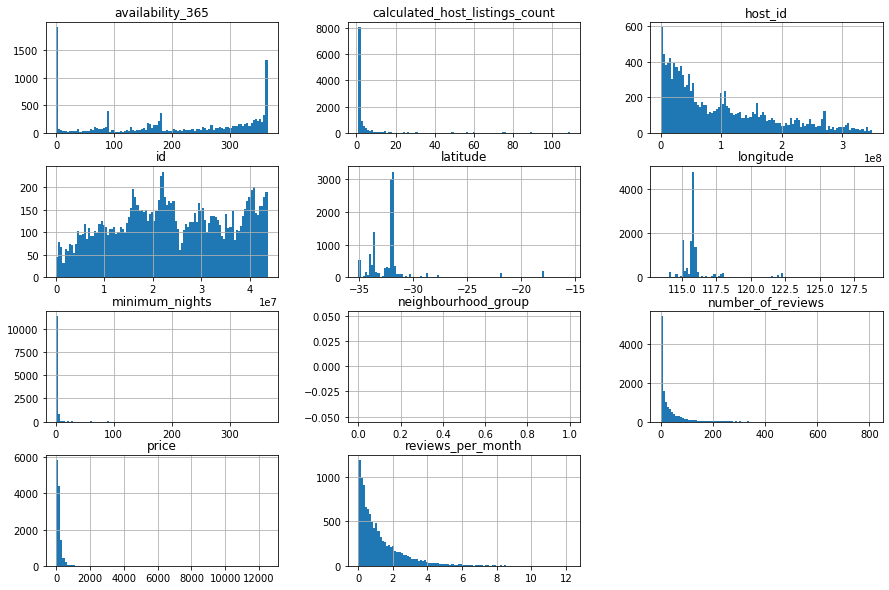

In [8]:
# plotar o histograma das variáveis quantitativas

df.hist(bins=100, figsize=(15,10));

No histograma é importante verificar sua forma, centralidade, amplitude e indícios da presença de outliers. 
Nos gráficos acima, parece haver valores distorcendo toda a representação gráfica desses atributos. Para explorar o que pode estar levando a essas distorções, vamos avaliar o resumo estatístico e gerar boxplots.

* Resumo estatístico por meio do método *describe()*

Nos fornece as seguintes informações estatísticas para cada variável:

count: contagem de elementos

mean:  média

std:   desvio padrão (grau de dispersão da variável)

min:   valor mínimo

25%:   primeiro intervalo interquartil (25% dos dados estão abaixo desse valor)

50%:   mediana (50% dos dados estão abaixo desse valor)

75%:   terceiro intervalo interquartil (75% dos dados estão abaixo desse valor)

max:   valor máximo

* *Boxplot*

O boxplot é construído com alguns dos resumos estatísticos obtidos acima: min, 25%, 50%, 75% e max. Complementa a visualização da centralidade (mediana), da dispersão (intervalo interquartil), da amplitude (min e max), e da presença de outliers. São muito úteis para comparações quando as observações estão divididas em grupos.

## Seria difícil construir uma interpretação razoável apenas com o histograma. As informações de cada etapa devem se complementar para evitar conclusões a partir de uma visualização superficial dos dados.


#### Resumo Estatístico ####

In [9]:
# selecionando do DataFrame somente as variáveis de interesse
df[['price', 'minimum_nights','calculated_host_listings_count',
    'availability_365', 'latitude', 'longitude']].describe()

,price,minimum_nights,calculated_host_listings_count,availability_365,latitude,longitude
count,12454.000000,12454.000000,12454.000000,12454.000000,12454.000000,12454.000000
mean,171.782399,3.250120,7.165730,202.291473,-32.031186,115.980445
std,238.798983,12.392662,16.637968,132.061636,2.593313,1.388102
min,0.000000,1.000000,1.000000,0.000000,-35.090420,113.456080
25%,85.000000,1.000000,1.000000,84.000000,-33.605537,115.609893
50%,131.000000,2.000000,2.000000,216.500000,-32.012225,115.788585
75%,200.000000,3.000000,4.000000,333.000000,-31.917160,115.901890
max,12500.000000,365.000000,109.000000,365.000000,-15.512410,128.778300


Olhando o resumo estatístico acima, podemos complementar algumas das obervações do histograma:

* *price*: observando o histograma, muitas propriedades parecem estar com o preço da diária no valor zero (gratuita) e outras com valores exageradamente altos (12000).  O resumo estatístico mostra uma média de preços de 171.78 e uma mediana de 131.00, sendo que boa parte dos dados estão entre os valores de 85.00 e 200.00.

* *availability_365*: parece haver muitas propriedades que não estão disponíveis nenhum dia do ano, o que não faria sentido estar no Airbnb. A disponibilidade, de uma forma geral, está entre 84 e 365 dias.

* *calculated_host_list_count*: um único anfitrião possui mais de 80 ou 100 propriedades. Isso também não faria sentido dentro da proposta do Airbnb. A maioria parece administrar de 1 a 4 propiedades.

* *minimun_nights*: não se encaixa na proposta do Airbnb um anfitrião exigir que a propriedade seja reservada por muitos meses ou o ano inteiro.

* *latitude*: mostra uma grande amplitude (norte a sul) para se definir uma região no mapa; isso era esperado, uma vez que esses dados se referem a todo o estado de Western Austrália.

* *longitude*: da mesma forma, a longitude mostra uma grande amplitude (leste e oeste).

#### Boxplot ####

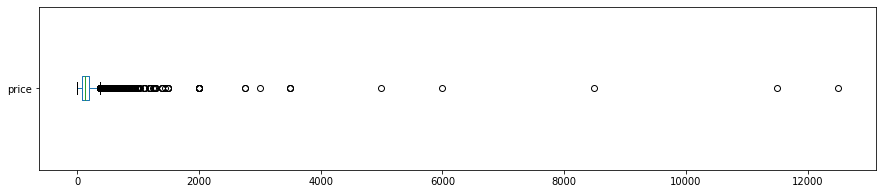


price: propriedades com um valor da diária acima de 1500:
17 entradas
0.1365%


In [10]:
# price
df.price.plot(kind='box', vert=False, figsize=(15,3))
plt.show()

# Considerando como o valor máximo de uma diária sendo até 1500,
# vamos ver a quantidade de valores acima de 1500 para price
print("\nprice: propriedades com um valor da diária acima de 1500:")
print("{} entradas".format(len(df[df.price > 1500])))
print("{:.4f}%".format((len(df[df.price > 1500]) / df.shape[0])*100))

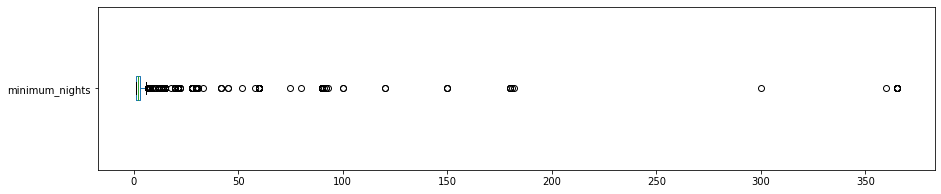

minimum_nights: valores acima de 30:
88 entradas
11.8436%


In [11]:
# minimun_nights
df.minimum_nights.plot(kind='box', vert=False, figsize=(15,3))
plt.show()

# Considerando que as reservas no Airbnb ocorrem por no máximo 30 dias,
# vamos ver a quantidade de valores acima de 30 dias para minimum_nights
print("minimum_nights: valores acima de 30:")
print("{} entradas".format(len(df[df.minimum_nights > 30])))
print("{:.4f}%".format((len(df[df.minimum_nights > 3]) / df.shape[0])*100))

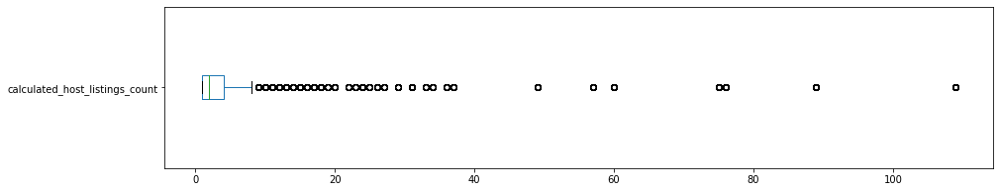


calculated_host_listings_count: anfitriões com mais de 10 propiedades:
1713 entradas
13.7546%


In [12]:
# calculated_host_listings_count
df.calculated_host_listings_count.plot(kind='box', vert=False, figsize=(15,3))
plt.show()

# Considerando que um anfitrião não tenha mais do que 10 propriedades no Airbnb,
# vamos ver quantos deles apresentam mais do que 10
print("\ncalculated_host_listings_count: anfitriões com mais de 10 propiedades:")
print("{} entradas".format(len(df[df.calculated_host_listings_count > 10])))
print("{:.4f}%".format((len(df[df.calculated_host_listings_count > 10]) / df.shape[0])*100))

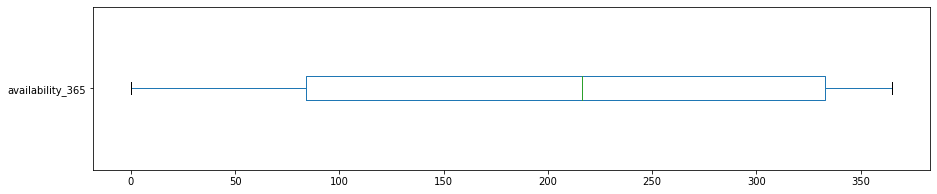


availability_365: propriedades não disponíveis:
1826 entradas
14.6620%


In [13]:
# availability_365
df.availability_365.plot(kind='box', vert=False, figsize=(15,3))
plt.show()

# Considerando que a propiedade precisa estar disponível pelo menos 1 dia no ano,
# vamos ver a quantidade de valores abaixo de 1 dia para availability_365
print("\navailability_365: propriedades não disponíveis:")
print("{} entradas".format(len(df[df.availability_365 < 1])))
print("{:.4f}%".format((len(df[df.availability_365 < 1]) / df.shape[0])*100))

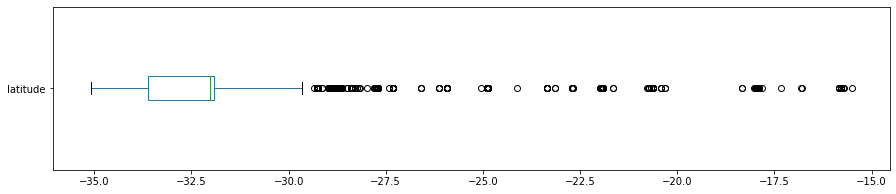


latitude: imóveis distantes de Perth:
953 entradas
7.6522%
3333 entradas
26.7625%


In [42]:
# latitude
df.latitude.plot(kind='box', vert=False, figsize=(15,3))
plt.show()

# Considerando somente os imóveis mais próximos à região da capital do estado,
# vamos ver a quantidade de imóveis que estão acima ou abaixo da faixa de valores para latitude do entorno de Perth 
print("\nlatitude: imóveis distantes de Perth:")
print("{} entradas".format(len(df[df.latitude > -31])))
print("{:.4f}%".format((len(df[df.latitude > -31]) / df.shape[0])*100))
print("{} entradas".format(len(df[df.latitude <  -33.5])))
print("{:.4f}%".format((len(df[df.latitude < -33.5]) / df.shape[0])*100))

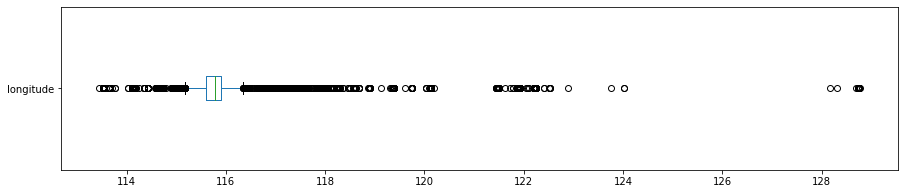


longitude: imóveis distantes de Perth:
1255 entradas
10.0771%


In [18]:
# longitude
df.longitude.plot(kind='box', vert=False, figsize=(15,3))
plt.show()

# Considerando somente os imóveis mais próximos à região da capital do estado, Perth,
# vamos ver a quantidade de valores acima de 116.5 graus para longitude
print("\nlongitude: imóveis distantes de Perth:")
print("{} entradas".format(len(df[df.longitude > 116.5])))
print("{:.4f}%".format((len(df[df.longitude > 116.5]) / df.shape[0])*100))

#### Considerações sobre as primeiras impressões dos dados como um todo

As observações iniciais permitiram identicar os valores que podem estar distorcendo as informações. Diante disso, iremos remover esses valores de cada variável. Note que existem várias possibilidades para a execução dessas etapas, sendo necessário um bom conhecimento dos dados para direcionar uma interpretação coerente, de uma forma que os dados não sejam transformados para forçar a existência de um resultado esperado. 


In [43]:
# remover os *outliers* e manter somente as variáves desejadas em um novo DataFrame
df_clean = df.copy()
keep = ['neighbourhood', 'room_type', 'price','number_of_reviews', 'reviews_per_month', 'minimum_nights', 'calculated_host_listings_count',
        'availability_365', 'latitude', 'longitude']
df_clean = df[keep]
df_clean.drop(df_clean[df_clean.price > 1500].index, axis=0, inplace=True)
df_clean.drop(df_clean[df_clean.minimum_nights > 30].index, axis=0, inplace=True)
df_clean.drop(df_clean[df_clean.calculated_host_listings_count > 10].index, axis=0, inplace=True)
df_clean.drop(df_clean[df_clean.availability_365 < 1].index, axis=0, inplace=True)
df_clean.drop(df_clean[df_clean.latitude > -31].index, axis=0, inplace=True)
df_clean.drop(df_clean[df_clean.latitude < -33.5].index, axis=0, inplace=True)
df_clean.drop(df_clean[df_clean.longitude > 116.5].index, axis=0, inplace=True)

import warnings
warnings.filterwarnings("ignore")

### **Novo DataFrame** 

In [44]:
df_clean.head()

,neighbourhood,room_type,price,number_of_reviews,reviews_per_month,minimum_nights,calculated_host_listings_count,availability_365,latitude,longitude
0,SOUTH PERTH,Private room,101,19,0.20,2,1,143,-32.00871,115.86407
1,MELVILLE,Private room,72,0,NaN,1,1,365,-32.06806,115.87674
3,CANNING,Private room,60,0,NaN,3,2,365,-32.00395,115.91394
5,GOSNELLS,Private room,64,7,0.06,1,1,362,-32.07592,115.93188
6,FREMANTLE,Entire home/apt,62,233,2.14,2,1,89,-32.04964,115.76582


In [58]:
# plotar um novo mapa para conferir se as coordenadas geográficas de cada propriedade correspondem a locais próximos à Perth
# foram utilizados dados somente de 500 propiedades para a verificação
locations = df_clean[['latitude', 'longitude']]
locationlist = locations.values.tolist()

map = folium.Map(location=[-31.87401, 115.94758], zoom_start=8)
for point in range(0, 500):
    folium.Marker(locationlist[point]).add_to(map)
map

#  referência: https://georgetsilva.github.io/posts/mapping-points-with-folium/

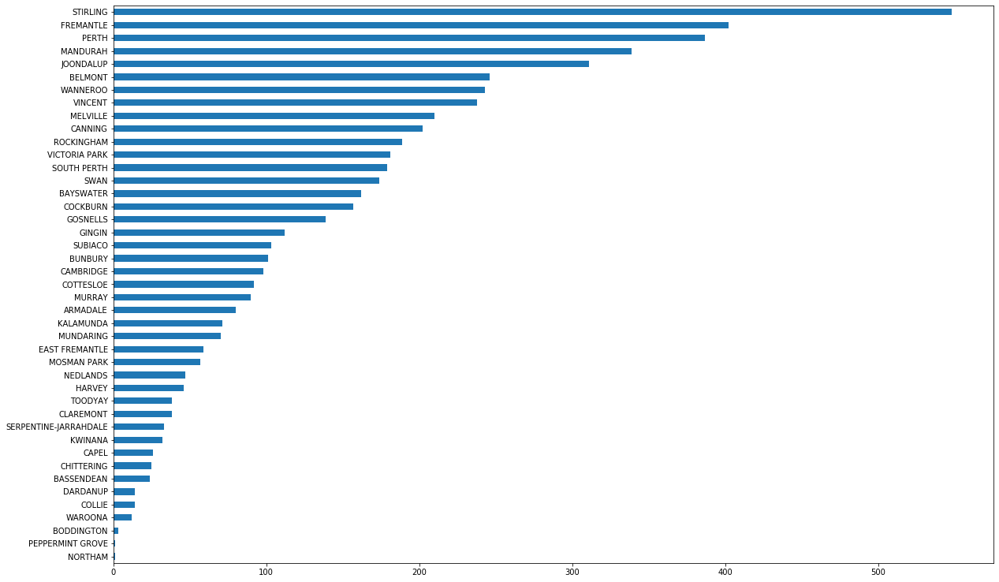

In [71]:

# Plotar a variável categórica 'neighbourhood' para visualizar os 20 locais com mais propriedades disponíveis,
df_clean['neighbourhood'].value_counts(ascending=True).head(50).plot(kind='barh', figsize=(20,13))
plt.show()

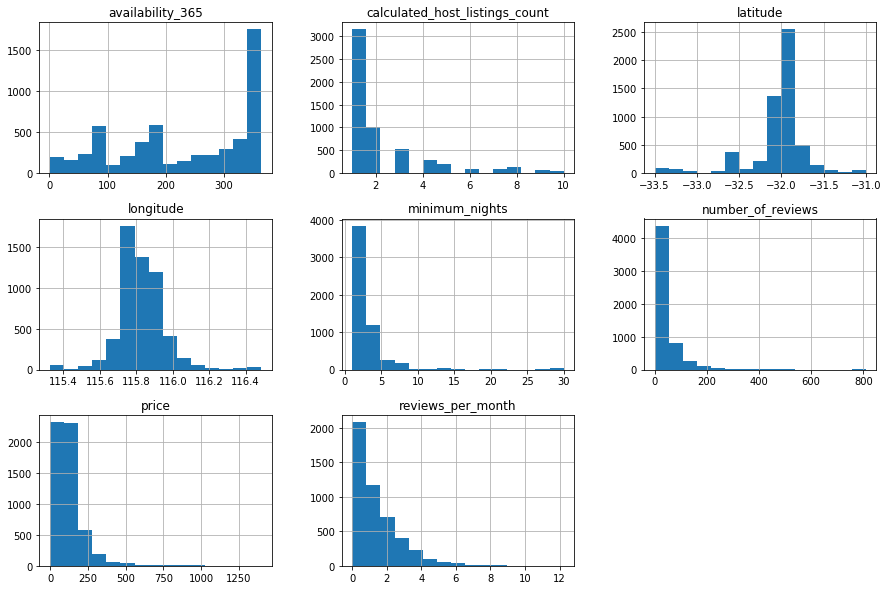

In [72]:
# plotar o histograma para as variáveis numéricas, após remover os outliers
df_clean.hist(bins=15, figsize=(15,10));

### **Q6. Inferências sobre o preço dos imóveis**

In [75]:
# ver média de preços por localidade, mostrando as 50 localidades com as médias mais altas
df_clean.groupby(['neighbourhood']).price.mean().sort_values(ascending=True)[:50]

neighbourhood
KWINANA                    65.531250
BASSENDEAN                 74.708333
BODDINGTON                 76.666667
NORTHAM                    80.000000
GOSNELLS                   82.676259
CANNING                    84.712871
BAYSWATER                  91.469136
ARMADALE                   93.012500
VICTORIA PARK              95.292818
BELMONT                    98.382114
COCKBURN                  105.643312
KALAMUNDA                 115.633803
BUNBURY                   115.950495
VINCENT                   116.752101
COLLIE                    119.785714
MELVILLE                  121.380952
MOSMAN PARK               121.543860
SWAN                      121.781609
WANNEROO                  125.045267
PERTH                     126.400517
SUBIACO                   130.398058
STIRLING                  130.812044
SOUTH PERTH               131.944134
JOONDALUP                 135.154341
SERPENTINE-JARRAHDALE     135.545455
TOODYAY                   138.789474
ROCKINGHAM              

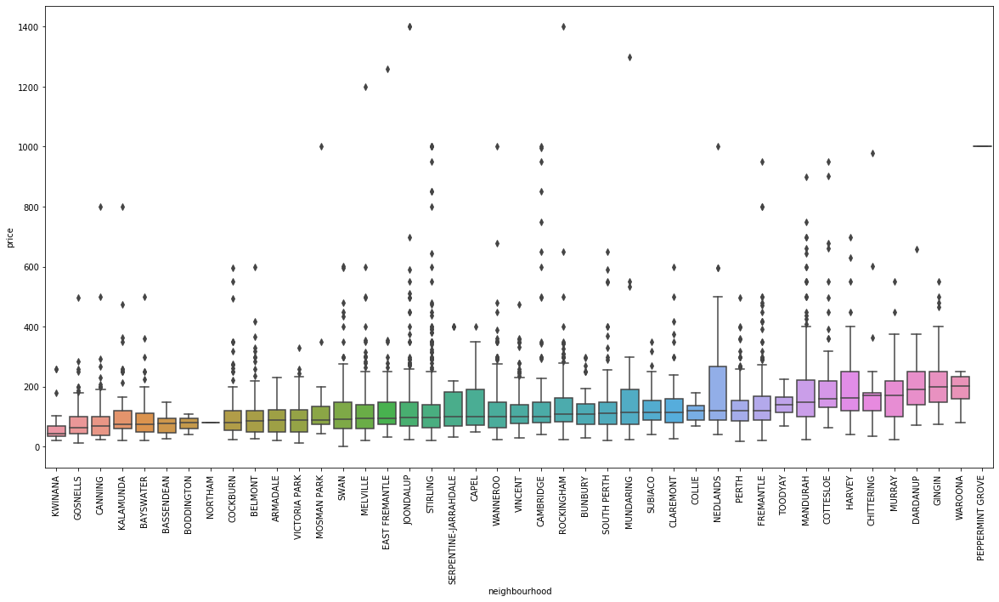

In [76]:
# visualizar as características dos preços por localidade, do mais barato para o mais caro
plt.figure(figsize=(20,10))

sorted_nb = df_clean.groupby(['neighbourhood'])['price'].median().sort_values()
sns.boxplot(x=df_clean['neighbourhood'], y=df_clean['price'], order=list(sorted_nb.index))

plt.xticks(rotation=90)
plt.show()

### **Q4. Qual a média dos preços de aluguel?**
Inicialmente foi observado um panorama geral sobre a média de preços de cada localidade, e agora será feita a estivativa da média de preços de todas as propriedades nas proximidades de Perth.

Como saber se podemos confiar na média de preços encontrada?
De todo o dataset de Western Australia, foram selecionados somente os imóveis próximos à região de Perth.

In [77]:
# eliminar linhas com valores faltantes
da = df_clean.dropna()

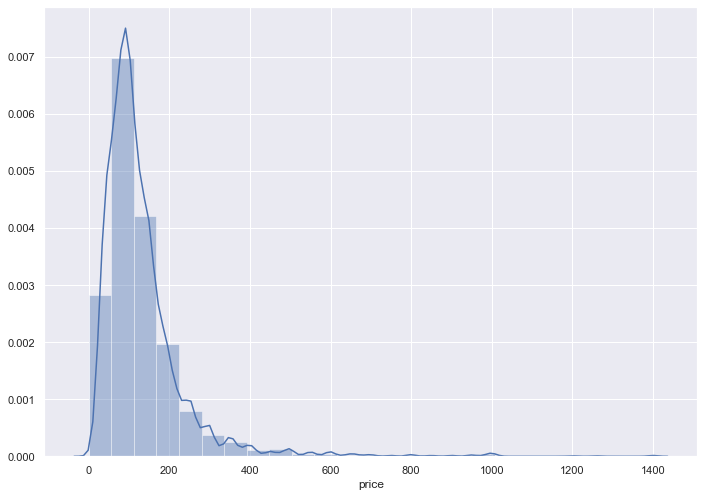

In [78]:
# utilização do histograma para verificar se o dado aparenta ter uma distribuição normal
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.distplot(da["price"], bins = 25)
plt.show()

De acordo com o Teorema do Limite Central, um número grande de amostras já permite caracterizar o preço dos imóveis como tendo uma distribuição normal.

Pela forma do histograma, os dados parecem apresentar uma distribuição normal.
Caso não seja possível assumir a normalidade dos dados, existem testes apropriados
(testes não paramétricos). 

In [79]:
# resumo estatístivo da variável preço
da.price.describe()

count    4858.000000
mean      131.093866
std       107.838542
min         0.000000
25%        70.000000
50%       101.000000
75%       154.000000
max      1400.000000
Name: price, dtype: float64

In [80]:
# número de observações, média e desvio padrão do preço (assumindo uma amostragem aleatória)
n = len(da.price)
mean = da.price.mean()
sd = da.price.std()
(n, mean, sd)

(4858, 131.09386578839027, 107.83854210203864)

A melhor inferência que conseguimos até agora é uma estimativa de que o preço médio dos imóveis do Airbnb próximos a Perth é de 131.09 

A próxima etapa será investigar o erro padrão dessa medida.

In [81]:
# o desvio padrão amostral encontrado acima foi de 107.84, mostrando uma grande variabilidade dos dados
# agora será estimado o erro padrão, o qual mede o quanto a média amostral tende a se afastar da média encontrada (131.09)
# quanto maior o erro padrão, menor o Intervalo de Confiança
se = sd/np.sqrt(n)
se

1.5471957103803187

In [82]:
# importar o pacote para as análises estatísticas
import statsmodels.api as sm

In [83]:
# Intervalo de Confiânça da média do preço
# nível de significância: 0.05

sm.stats.DescrStatsW(da.price).zconfint_mean(alpha=0.05)

(128.06141791900998, 134.12631365777057)

Assim, se fossem repetidas análises com outras amostras de propriedades do Airbnb nessa mesma região,
teríamos 95% de confiança que a média de preços estaria no intervalo de 128.06 a 134.13

A média de preços encontrada, 131.09, está dentro do Intervalo de Confiança, parecendo ser uma medida confiável

#### O DataSet analisado permite que seja aplicada uma variadade de análises estatísticas inferenciais. Esse notebook serviu apenas para demonstrar uma possibilidade de abordagem estatística para se identificar a média de preços das propriedades disponíveis no Airbnb nas proximidades Perth, capital do estado de Western Austrália 

### **Q5. Próximos passos**


### Uma próxima etapa poderia ser a eploração das relações entre as variáveis, bem como a predição de valores.

Por exemplo, se for encontrada alguma correlação da variável preço com as demais variáveis, podem ser aplicados modelos estatísticos para se predizer essa variável de interesse com base em outros valores da base de dados.


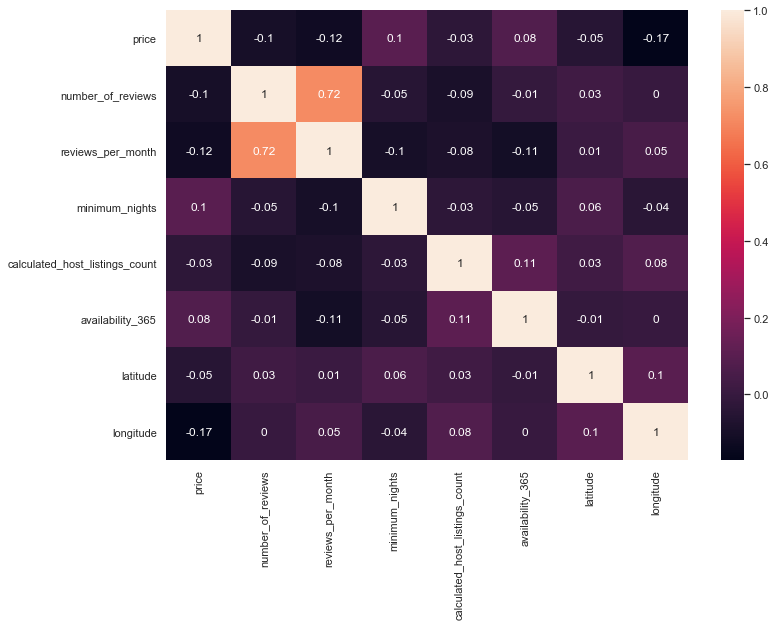

In [84]:
correlation_matrix = da.corr().round(2)

sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.heatmap(data=correlation_matrix, annot=True)
plt.show()

## Conclusões
